First visualization - City of Toronto, Swimsafe dataset

In [2]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy
import PIL
import requests

# Toronto Open Data is stored in a CKAN instance. It's APIs are documented here:
# https://docs.ckan.org/en/latest/api/

# To hit our API, you'll be making requests to:
base_url = "https://ckan0.cf.opendata.inter.prod-toronto.ca"

# Datasets are called "packages". Each package can contain many "resources"
# To retrieve the metadata for this package and its resources, use the package name in this page's URL:
url = base_url + "/api/3/action/package_show"
params = { "id": "toronto-island-ferry-ticket-counts"}
package = requests.get(url, params = params).json()

# To get resource data:
for idx, resource in enumerate(package["result"]["resources"]):

       # for datastore_active resources:
       if resource["datastore_active"]:

           # To get all records in CSV format:
           url = base_url + "/datastore/dump/" + resource["id"]
           resource_dump_data = requests.get(url).text
           print(resource_dump_data)

           # To selectively pull records and attribute-level metadata:
           url = base_url + "/api/3/action/datastore_search"
           p = { "id": resource["id"] }
           resource_search_data = requests.get(url, params = p).json()["result"]
           print(resource_search_data)
           # This API call has many parameters. They're documented here:
           # https://docs.ckan.org/en/latest/maintaining/datastore.html

       # To get metadata for non datastore_active resources:
       if not resource["datastore_active"]:
           url = base_url + "/api/3/action/resource_show?id=" + resource["id"]
           resource_metadata = requests.get(url).json()
           print(resource_metadata)
           # From here, you can use the "url" attribute to download this file


_id,Timestamp,Redemption Count,Sales Count
1,2026-06-18T12:30:00,87,64
2,2026-06-18T12:15:00,84,108
3,2026-06-18T12:00:00,68,74
4,2026-06-18T11:45:00,40,64
5,2026-06-18T11:30:00,52,66
6,2026-06-18T11:15:00,59,53
7,2026-06-18T11:00:00,54,60
8,2026-06-18T10:45:00,93,44
9,2026-06-18T10:30:00,63,24
10,2026-06-18T10:15:00,56,12
11,2026-06-18T10:00:00,16,50
12,2026-06-18T09:45:00,43,8
13,2026-06-18T09:30:00,49,52
14,2026-06-18T09:15:00,10,6
15,2026-06-18T09:00:00,21,13
16,2026-06-18T08:45:00,8,109
17,2026-06-18T08:30:00,9,8
18,2026-06-18T08:15:00,25,7
19,2026-06-18T08:00:00,9,37
20,2026-06-18T07:45:00,8,12
21,2026-06-18T07:30:00,10,24
22,2026-06-18T07:15:00,5,2
23,2026-06-18T07:00:00,8,26
24,2026-06-18T06:45:00,7,10
25,2026-06-18T06:30:00,8,7
26,2026-06-18T05:00:00,0,2
27,2026-06-18T03:15:00,0,1
28,2026-06-18T02:15:00,0,2
29,2026-06-18T01:30:00,0,2
30,2026-06-18T01:00:00,0,1
31,2026-06-18T00:15:00,0,11
32,2026-06-18T00:00:00,0,1
33,2026-06-17T23:45:00,0,1
34,2026-06-17T23:30:00,10,7
35,2026-

In [3]:
# Displaying the raw data as a data frame
from io import StringIO
ferry_data = pd.read_csv(StringIO(resource_dump_data))
print(ferry_data.head())

   _id            Timestamp  Redemption Count  Sales Count
0    1  2026-06-18T12:30:00                87           64
1    2  2026-06-18T12:15:00                84          108
2    3  2026-06-18T12:00:00                68           74
3    4  2026-06-18T11:45:00                40           64
4    5  2026-06-18T11:30:00                52           66


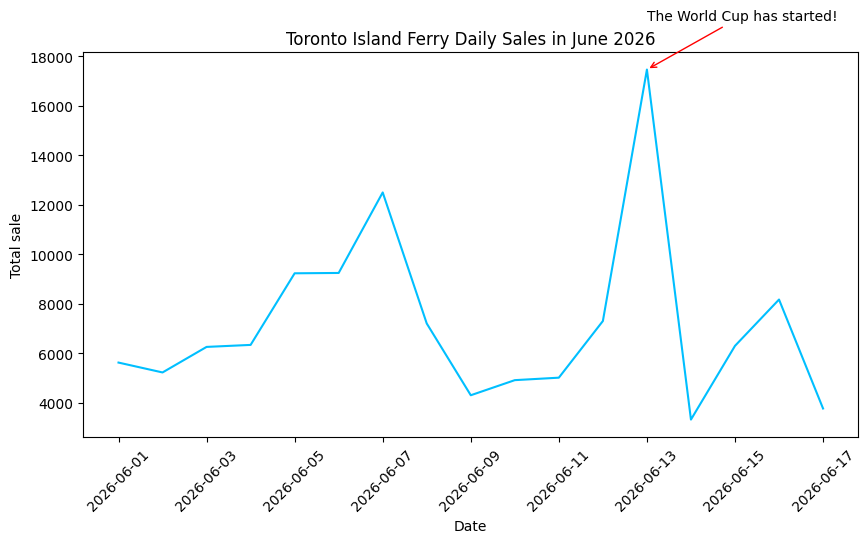

In [4]:
# Only including June 2026 data

ferry_data["Timestamp"] = pd.to_datetime(ferry_data["Timestamp"])
ferry_data = ferry_data.sort_values("Timestamp")

start = pd.Timestamp("2026-06-01")
end = pd.Timestamp("2026-06-18")

june_2026 = ferry_data[
    (ferry_data["Timestamp"] >= start) &
    (ferry_data["Timestamp"] < end)]

# Reducing noice in data (too many timestamps) by showing the daily sums of sales

daily = june_2026.groupby(
    june_2026["Timestamp"].dt.date
)["Sales Count"].sum().reset_index()

daily.columns = ["Date", "Sales Count"]

# Lineplotting the data
plt.figure(figsize=(10, 5))

ax = sns.lineplot(data = daily,   
             x ='Date', 
             y = 'Sales Count',
             color = 'deepskyblue',
             )      

ax.set(title='Toronto Island Ferry Daily Sales in June 2026',
             xlabel='Date',
             ylabel='Total sale')
ax.tick_params(axis='x', labelrotation=45)

# Annotating the spike in sales
max_row = daily.loc[daily["Sales Count"].idxmax()]
x_max = max_row["Date"]
y_max = max_row["Sales Count"]
ax.annotate('The World Cup has started!', xy=(x_max, y_max),
    xytext=(x_max, y_max + 2000),
    arrowprops=dict(arrowstyle='->', color='red')
)


# Saving the figure
path = r'C:\Users\melit\DSI\visualization\02_activities\assignments\assignment_3'
filename = 'First-visualization-Toronto-Island-Ferry-Daily-Sales-June-2026.png'
plt.savefig(path+ "\\" + filename, dpi=300)